**3D UNet, FedAvg, ISLES'24**

In [41]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [42]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet, UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [43]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [44]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES24 Split Preprocessed"
print(data_dir)

D:/F25-156/ISLES24 Split Preprocessed


In [45]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet/Federated_UNet_checkpoints"
log_dir = "D:/F25-156/UNet/Federated_UNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

Checkpoints will be saved to: D:/F25-156/UNet/Federated_UNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet/Federated_UNet_logs


In [46]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [47]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [48]:
target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [49]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [50]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 40 | Image shape: (512, 512, 83) | Mask shape: (512, 512, 83) | Mask values: tensor([0., 1.], dtype=torch.float64)


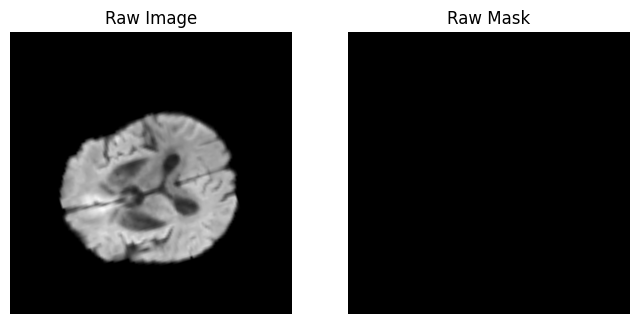

Sample 7 | Image shape: (512, 553, 70) | Mask shape: (512, 553, 70) | Mask values: tensor([0., 1.], dtype=torch.float64)


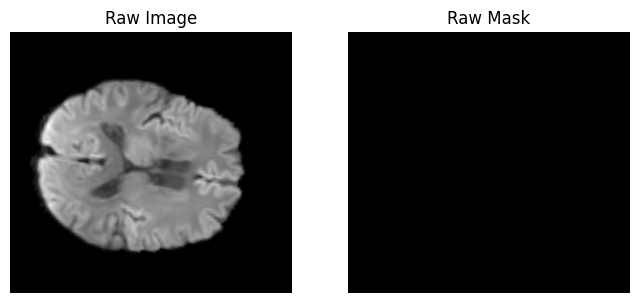


🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


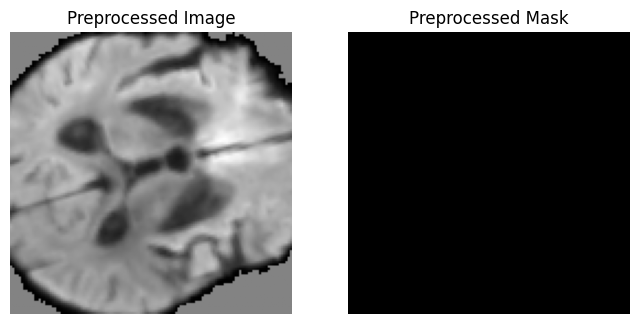

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


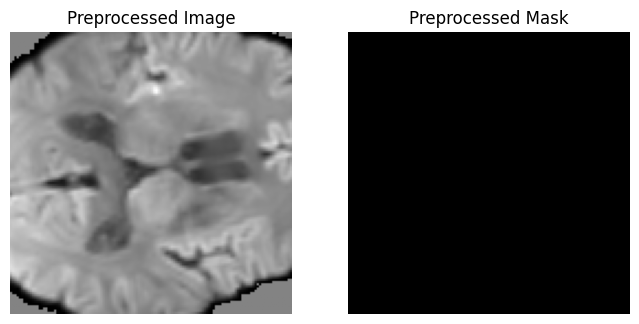


Client 0 dataset size: 50

Client 1
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 1 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


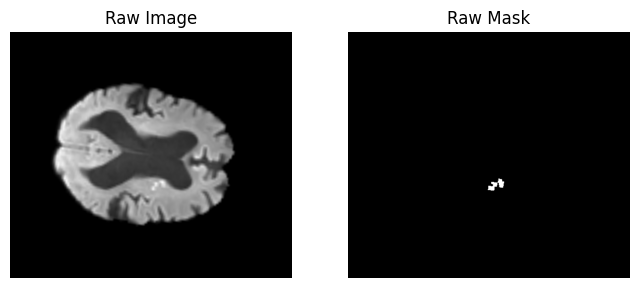

Sample 47 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


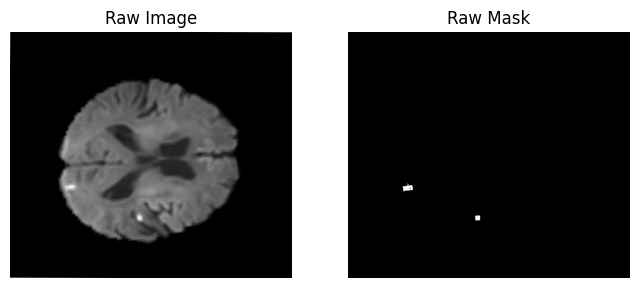


🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


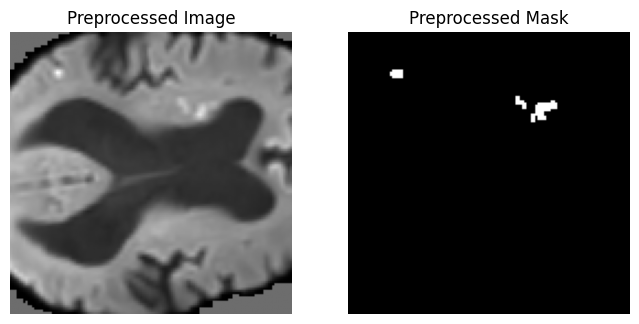

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


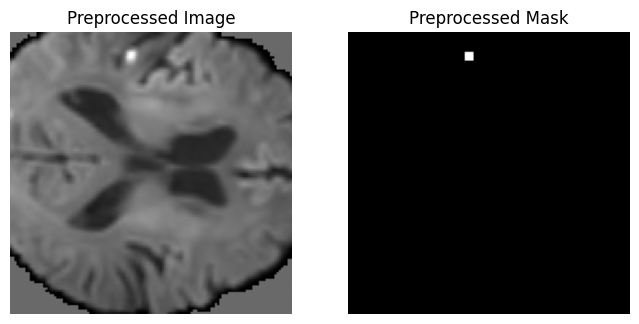


Client 1 dataset size: 50


In [51]:

original_root = "D:/F25-156/ISLES24 Split"
processed_root = "D:/F25-156/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:

        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(
            f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
            f"Mask values: {torch.unique(torch.tensor(mask))}"
        )

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [52]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [53]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [54]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## UNet

In [55]:
def create_model():
   model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
   print(model)
   return model

**Client Class**

In [56]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [57]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [58]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [59]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:                                                                                                                      
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9146 | Dice: 0.0243 | IoU: 0.0123 | HD95: 86.2842


Client 0 | Epoch 2/20 | Loss: 0.9017 | Dice: 0.0248 | IoU: 0.0125 | HD95: 85.4775


Client 0 | Epoch 3/20 | Loss: 0.8982 | Dice: 0.0260 | IoU: 0.0132 | HD95: 85.4135


Client 0 | Epoch 4/20 | Loss: 0.8962 | Dice: 0.0275 | IoU: 0.0139 | HD95: 85.3145


Client 0 | Epoch 5/20 | Loss: 0.8944 | Dice: 0.0285 | IoU: 0.0145 | HD95: 85.3047


Client 0 | Epoch 6/20 | Loss: 0.8928 | Dice: 0.0296 | IoU: 0.0150 | HD95: 85.6752


Client 0 | Epoch 7/20 | Loss: 0.8911 | Dice: 0.0309 | IoU: 0.0157 | HD95: 86.5675


Client 0 | Epoch 8/20 | Loss: 0.8902 | Dice: 0.0335 | IoU: 0.0171 | HD95: 86.8601


Client 0 | Epoch 9/20 | Loss: 0.8886 | Dice: 0.0359 | IoU: 0.0183 | HD95: 86.6486


Client 0 | Epoch 10/20 | Loss: 0.8868 | Dice: 0.0401 | IoU: 0.0204 | HD95: 86.5512


Client 0 | Epoch 11/20 | Loss: 0.8849 | Dice: 0.0456 | IoU: 0.0234 | HD95: 86.4740


Client 0 | Epoch 12/20 | Loss: 0.8831 | Dice: 0.0547 | IoU: 0.0281 | HD95: 86.3702


Client 0 | Epoch 13/20 | Loss: 0.8815 | Dice: 0.0656 | IoU: 0.0339 | HD95: 86.2742


Client 0 | Epoch 14/20 | Loss: 0.8808 | Dice: 0.0822 | IoU: 0.0428 | HD95: 85.9009


Client 0 | Epoch 15/20 | Loss: 0.8785 | Dice: 0.1070 | IoU: 0.0565 | HD95: 85.6971


Client 0 | Epoch 16/20 | Loss: 0.8771 | Dice: 0.1403 | IoU: 0.0754 | HD95: 84.7288


Client 0 | Epoch 17/20 | Loss: 0.8754 | Dice: 0.1713 | IoU: 0.0937 | HD95: 84.3473


Client 0 | Epoch 18/20 | Loss: 0.8752 | Dice: 0.1846 | IoU: 0.1017 | HD95: 84.6285


Client 0 | Epoch 19/20 | Loss: 0.8750 | Dice: 0.1989 | IoU: 0.1104 | HD95: 83.6136


Clients Training:  50%|█████     | 1/2 [07:28<07:28, 448.75s/it]

Client 0 | Epoch 20/20 | Loss: 0.8720 | Dice: 0.2238 | IoU: 0.1260 | HD95: 83.9179
Client 0 | Loss=0.8869 | Dice=0.2238 | IoU=0.1260 | HD95=83.9179


Client 1 | Epoch 1/20 | Loss: 0.9215 | Dice: 0.0190 | IoU: 0.0096 | HD95: 82.4219


Client 1 | Epoch 2/20 | Loss: 0.9093 | Dice: 0.0194 | IoU: 0.0098 | HD95: 81.0032


Client 1 | Epoch 3/20 | Loss: 0.9054 | Dice: 0.0193 | IoU: 0.0098 | HD95: 80.4262


Client 1 | Epoch 4/20 | Loss: 0.9029 | Dice: 0.0197 | IoU: 0.0099 | HD95: 80.8978


Client 1 | Epoch 5/20 | Loss: 0.9010 | Dice: 0.0203 | IoU: 0.0103 | HD95: 80.8282


Client 1 | Epoch 6/20 | Loss: 0.8997 | Dice: 0.0205 | IoU: 0.0103 | HD95: 80.6142


Client 1 | Epoch 7/20 | Loss: 0.8985 | Dice: 0.0208 | IoU: 0.0105 | HD95: 81.1247


Client 1 | Epoch 8/20 | Loss: 0.8974 | Dice: 0.0216 | IoU: 0.0109 | HD95: 81.8027


Client 1 | Epoch 9/20 | Loss: 0.8962 | Dice: 0.0224 | IoU: 0.0113 | HD95: 81.9097


Client 1 | Epoch 10/20 | Loss: 0.8950 | Dice: 0.0242 | IoU: 0.0122 | HD95: 82.2869


Client 1 | Epoch 11/20 | Loss: 0.8938 | Dice: 0.0269 | IoU: 0.0136 | HD95: 82.2308


Client 1 | Epoch 12/20 | Loss: 0.8922 | Dice: 0.0307 | IoU: 0.0156 | HD95: 82.0649


Client 1 | Epoch 13/20 | Loss: 0.8908 | Dice: 0.0363 | IoU: 0.0185 | HD95: 81.8300


Client 1 | Epoch 14/20 | Loss: 0.8893 | Dice: 0.0463 | IoU: 0.0237 | HD95: 81.5362


Client 1 | Epoch 15/20 | Loss: 0.8877 | Dice: 0.0613 | IoU: 0.0316 | HD95: 81.3177


Client 1 | Epoch 16/20 | Loss: 0.8862 | Dice: 0.0842 | IoU: 0.0440 | HD95: 80.9341


Client 1 | Epoch 17/20 | Loss: 0.8849 | Dice: 0.1141 | IoU: 0.0605 | HD95: 81.5848


Client 1 | Epoch 18/20 | Loss: 0.8832 | Dice: 0.1429 | IoU: 0.0769 | HD95: 81.2917


Client 1 | Epoch 19/20 | Loss: 0.8819 | Dice: 0.1693 | IoU: 0.0925 | HD95: 81.2348


Client 1 Epochs: 100%|██████████| 20/20 [07:23<00:00, 22.19s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.8808 | Dice: 0.1939 | IoU: 0.1073 | HD95: 81.0998
Client 1 | Loss=0.8949 | Dice=0.1939 | IoU=0.1073 | HD95=81.0998


Best global model updated with Dice=0.2241
Global | Val Loss=0.8638 | Dice=0.2241 | IoU=0.1262 | HD95=73.4962
Checkpoint saved for round 1 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8740 | Dice: 0.2078 | IoU: 0.1159 | HD95: 84.1411


Client 0 | Epoch 2/20 | Loss: 0.8716 | Dice: 0.2234 | IoU: 0.1258 | HD95: 83.7761


Client 0 | Epoch 3/20 | Loss: 0.8718 | Dice: 0.2312 | IoU: 0.1307 | HD95: 82.7166


Client 0 | Epoch 4/20 | Loss: 0.8697 | Dice: 0.2576 | IoU: 0.1478 | HD95: 83.5191


Client 0 | Epoch 5/20 | Loss: 0.8677 | Dice: 0.2757 | IoU: 0.1599 | HD95: 81.4389


Client 0 | Epoch 6/20 | Loss: 0.8656 | Dice: 0.2912 | IoU: 0.1704 | HD95: 80.7676


Client 0 | Epoch 7/20 | Loss: 0.8646 | Dice: 0.2954 | IoU: 0.1733 | HD95: 79.9131


Client 0 | Epoch 8/20 | Loss: 0.8629 | Dice: 0.3131 | IoU: 0.1856 | HD95: 79.2040


Client 0 | Epoch 9/20 | Loss: 0.8616 | Dice: 0.3213 | IoU: 0.1914 | HD95: 78.4525


Client 0 | Epoch 10/20 | Loss: 0.8618 | Dice: 0.3273 | IoU: 0.1957 | HD95: 77.9812


Client 0 | Epoch 11/20 | Loss: 0.8622 | Dice: 0.3230 | IoU: 0.1926 | HD95: 79.3229


Client 0 | Epoch 12/20 | Loss: 0.8593 | Dice: 0.3389 | IoU: 0.2041 | HD95: 77.9052


Client 0 | Epoch 13/20 | Loss: 0.8576 | Dice: 0.3531 | IoU: 0.2144 | HD95: 76.3667


Client 0 | Epoch 14/20 | Loss: 0.8566 | Dice: 0.3681 | IoU: 0.2256 | HD95: 76.1456


Client 0 | Epoch 15/20 | Loss: 0.8560 | Dice: 0.3684 | IoU: 0.2258 | HD95: 74.5494


Client 0 | Epoch 16/20 | Loss: 0.8537 | Dice: 0.3806 | IoU: 0.2351 | HD95: 72.7083


Client 0 | Epoch 17/20 | Loss: 0.8526 | Dice: 0.4011 | IoU: 0.2509 | HD95: 72.1666


Client 0 | Epoch 18/20 | Loss: 0.8511 | Dice: 0.4090 | IoU: 0.2571 | HD95: 69.6634


Client 0 | Epoch 19/20 | Loss: 0.8499 | Dice: 0.4186 | IoU: 0.2647 | HD95: 67.2359


Clients Training:  50%|█████     | 1/2 [06:58<06:58, 418.93s/it]

Client 0 | Epoch 20/20 | Loss: 0.8489 | Dice: 0.4338 | IoU: 0.2770 | HD95: 66.1152
Client 0 | Loss=0.8610 | Dice=0.4338 | IoU=0.2770 | HD95=66.1152


Client 1 | Epoch 1/20 | Loss: 0.8831 | Dice: 0.1597 | IoU: 0.0868 | HD95: 80.8058


Client 1 | Epoch 2/20 | Loss: 0.8819 | Dice: 0.1695 | IoU: 0.0926 | HD95: 81.1720


Client 1 | Epoch 3/20 | Loss: 0.8792 | Dice: 0.2119 | IoU: 0.1185 | HD95: 80.3081


Client 1 | Epoch 4/20 | Loss: 0.8774 | Dice: 0.2362 | IoU: 0.1339 | HD95: 80.5128


Client 1 | Epoch 5/20 | Loss: 0.8768 | Dice: 0.2289 | IoU: 0.1292 | HD95: 79.9664


Client 1 | Epoch 6/20 | Loss: 0.8750 | Dice: 0.2646 | IoU: 0.1525 | HD95: 79.7169


Client 1 | Epoch 7/20 | Loss: 0.8734 | Dice: 0.2808 | IoU: 0.1634 | HD95: 79.0617


Client 1 | Epoch 8/20 | Loss: 0.8723 | Dice: 0.2905 | IoU: 0.1699 | HD95: 78.3664


Client 1 | Epoch 9/20 | Loss: 0.8711 | Dice: 0.3025 | IoU: 0.1782 | HD95: 76.7115


Client 1 | Epoch 10/20 | Loss: 0.8716 | Dice: 0.3075 | IoU: 0.1817 | HD95: 77.2444


Client 1 | Epoch 11/20 | Loss: 0.8699 | Dice: 0.3182 | IoU: 0.1892 | HD95: 76.1208


Client 1 | Epoch 12/20 | Loss: 0.8680 | Dice: 0.3404 | IoU: 0.2051 | HD95: 73.3258


Client 1 | Epoch 13/20 | Loss: 0.8667 | Dice: 0.3634 | IoU: 0.2220 | HD95: 70.9958


Client 1 | Epoch 14/20 | Loss: 0.8656 | Dice: 0.3716 | IoU: 0.2282 | HD95: 68.7408


Client 1 | Epoch 15/20 | Loss: 0.8645 | Dice: 0.3890 | IoU: 0.2414 | HD95: 68.0453


Client 1 | Epoch 16/20 | Loss: 0.8634 | Dice: 0.4062 | IoU: 0.2548 | HD95: 67.7445


Client 1 | Epoch 17/20 | Loss: 0.8623 | Dice: 0.4228 | IoU: 0.2681 | HD95: 66.4428


Client 1 | Epoch 18/20 | Loss: 0.8612 | Dice: 0.4373 | IoU: 0.2798 | HD95: 65.5945


Client 1 | Epoch 19/20 | Loss: 0.8600 | Dice: 0.4570 | IoU: 0.2962 | HD95: 64.8679


Client 1 Epochs: 100%|██████████| 20/20 [06:50<00:00, 20.55s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.8589 | Dice: 0.4673 | IoU: 0.3049 | HD95: 61.9320
Client 1 | Loss=0.8701 | Dice=0.4673 | IoU=0.3049 | HD95=61.9320


Best global model updated with Dice=0.4230
Global | Val Loss=0.8367 | Dice=0.4230 | IoU=0.2682 | HD95=50.5763
Checkpoint saved for round 2 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8526 | Dice: 0.4435 | IoU: 0.2849 | HD95: 63.7336


Client 0 | Epoch 2/20 | Loss: 0.8530 | Dice: 0.3772 | IoU: 0.2325 | HD95: 69.1853


Client 0 | Epoch 3/20 | Loss: 0.8502 | Dice: 0.3980 | IoU: 0.2484 | HD95: 67.2154


Client 0 | Epoch 4/20 | Loss: 0.8465 | Dice: 0.4633 | IoU: 0.3015 | HD95: 62.5956


Client 0 | Epoch 5/20 | Loss: 0.8453 | Dice: 0.4606 | IoU: 0.2992 | HD95: 61.9381


Client 0 | Epoch 6/20 | Loss: 0.8449 | Dice: 0.4463 | IoU: 0.2873 | HD95: 58.1603


Client 0 | Epoch 7/20 | Loss: 0.8486 | Dice: 0.4010 | IoU: 0.2508 | HD95: 65.4731


Client 0 | Epoch 8/20 | Loss: 0.8440 | Dice: 0.4294 | IoU: 0.2734 | HD95: 60.5273


Client 0 | Epoch 9/20 | Loss: 0.8419 | Dice: 0.4555 | IoU: 0.2949 | HD95: 61.0078


Client 0 | Epoch 10/20 | Loss: 0.8401 | Dice: 0.4856 | IoU: 0.3207 | HD95: 59.4741


Client 0 | Epoch 11/20 | Loss: 0.8391 | Dice: 0.4994 | IoU: 0.3328 | HD95: 57.9161


Client 0 | Epoch 12/20 | Loss: 0.8374 | Dice: 0.5073 | IoU: 0.3399 | HD95: 58.8017


Client 0 | Epoch 13/20 | Loss: 0.8358 | Dice: 0.5285 | IoU: 0.3591 | HD95: 56.5964


Client 0 | Epoch 14/20 | Loss: 0.8346 | Dice: 0.5312 | IoU: 0.3617 | HD95: 55.1175


Client 0 | Epoch 15/20 | Loss: 0.8331 | Dice: 0.5461 | IoU: 0.3756 | HD95: 52.1015


Client 0 | Epoch 16/20 | Loss: 0.8319 | Dice: 0.5600 | IoU: 0.3889 | HD95: 52.7457


Client 0 | Epoch 17/20 | Loss: 0.8306 | Dice: 0.5658 | IoU: 0.3945 | HD95: 52.1258


Client 0 | Epoch 18/20 | Loss: 0.8297 | Dice: 0.5674 | IoU: 0.3961 | HD95: 50.7025


Client 0 | Epoch 19/20 | Loss: 0.8281 | Dice: 0.5801 | IoU: 0.4086 | HD95: 50.4043


Clients Training:  50%|█████     | 1/2 [06:04<06:04, 364.03s/it]

Client 0 | Epoch 20/20 | Loss: 0.8269 | Dice: 0.5928 | IoU: 0.4212 | HD95: 47.1311
Client 0 | Loss=0.8397 | Dice=0.5928 | IoU=0.4212 | HD95=47.1311


Client 1 | Epoch 1/20 | Loss: 0.8622 | Dice: 0.3874 | IoU: 0.2403 | HD95: 65.4020


Client 1 | Epoch 2/20 | Loss: 0.8602 | Dice: 0.4248 | IoU: 0.2696 | HD95: 65.5564


Client 1 | Epoch 3/20 | Loss: 0.8578 | Dice: 0.4455 | IoU: 0.2866 | HD95: 63.0566


Client 1 | Epoch 4/20 | Loss: 0.8562 | Dice: 0.4794 | IoU: 0.3153 | HD95: 59.0397


Client 1 | Epoch 5/20 | Loss: 0.8551 | Dice: 0.4785 | IoU: 0.3145 | HD95: 56.8043


Client 1 | Epoch 6/20 | Loss: 0.8538 | Dice: 0.5119 | IoU: 0.3440 | HD95: 55.7552


Client 1 | Epoch 7/20 | Loss: 0.8527 | Dice: 0.5144 | IoU: 0.3463 | HD95: 52.0190


Client 1 | Epoch 8/20 | Loss: 0.8515 | Dice: 0.5300 | IoU: 0.3606 | HD95: 51.3187


Client 1 | Epoch 9/20 | Loss: 0.8504 | Dice: 0.5474 | IoU: 0.3769 | HD95: 47.8785


Client 1 | Epoch 10/20 | Loss: 0.8493 | Dice: 0.5591 | IoU: 0.3880 | HD95: 45.1538


Client 1 | Epoch 11/20 | Loss: 0.8483 | Dice: 0.5653 | IoU: 0.3940 | HD95: 44.8706


Client 1 | Epoch 12/20 | Loss: 0.8472 | Dice: 0.5649 | IoU: 0.3936 | HD95: 42.6302


Client 1 | Epoch 13/20 | Loss: 0.8462 | Dice: 0.5819 | IoU: 0.4104 | HD95: 40.8451


Client 1 | Epoch 14/20 | Loss: 0.8452 | Dice: 0.5809 | IoU: 0.4093 | HD95: 42.1646


Client 1 | Epoch 15/20 | Loss: 0.8444 | Dice: 0.5798 | IoU: 0.4083 | HD95: 41.7897


Client 1 | Epoch 16/20 | Loss: 0.8432 | Dice: 0.5924 | IoU: 0.4209 | HD95: 39.0761


Client 1 | Epoch 17/20 | Loss: 0.8420 | Dice: 0.6085 | IoU: 0.4373 | HD95: 35.0757


Client 1 | Epoch 18/20 | Loss: 0.8410 | Dice: 0.6101 | IoU: 0.4389 | HD95: 34.1944


Client 1 | Epoch 19/20 | Loss: 0.8400 | Dice: 0.6170 | IoU: 0.4462 | HD95: 36.3409


Client 1 Epochs: 100%|██████████| 20/20 [06:06<00:00, 18.31s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.8391 | Dice: 0.6109 | IoU: 0.4398 | HD95: 34.7863
Client 1 | Loss=0.8493 | Dice=0.6109 | IoU=0.4398 | HD95=34.7863


Best global model updated with Dice=0.5124
Global | Val Loss=0.8129 | Dice=0.5124 | IoU=0.3445 | HD95=40.2078
Checkpoint saved for round 3 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8281 | Dice: 0.5480 | IoU: 0.3774 | HD95: 49.8521


Client 0 | Epoch 2/20 | Loss: 0.8280 | Dice: 0.5294 | IoU: 0.3600 | HD95: 50.9476


Client 0 | Epoch 3/20 | Loss: 0.8279 | Dice: 0.4906 | IoU: 0.3250 | HD95: 50.3490


Client 0 | Epoch 4/20 | Loss: 0.8239 | Dice: 0.5607 | IoU: 0.3896 | HD95: 49.4800


Client 0 | Epoch 5/20 | Loss: 0.8222 | Dice: 0.5729 | IoU: 0.4014 | HD95: 46.0166


Client 0 | Epoch 6/20 | Loss: 0.8202 | Dice: 0.6000 | IoU: 0.4286 | HD95: 44.6305


Client 0 | Epoch 7/20 | Loss: 0.8187 | Dice: 0.6220 | IoU: 0.4514 | HD95: 42.0990


Client 0 | Epoch 8/20 | Loss: 0.8174 | Dice: 0.6246 | IoU: 0.4541 | HD95: 41.8313


Client 0 | Epoch 9/20 | Loss: 0.8160 | Dice: 0.6299 | IoU: 0.4598 | HD95: 38.7662


Client 0 | Epoch 10/20 | Loss: 0.8147 | Dice: 0.6358 | IoU: 0.4660 | HD95: 39.9482


Client 0 | Epoch 11/20 | Loss: 0.8134 | Dice: 0.6442 | IoU: 0.4751 | HD95: 39.4384


Client 0 | Epoch 12/20 | Loss: 0.8121 | Dice: 0.6423 | IoU: 0.4730 | HD95: 40.2858


Client 0 | Epoch 13/20 | Loss: 0.8108 | Dice: 0.6462 | IoU: 0.4774 | HD95: 37.9691


Client 0 | Epoch 14/20 | Loss: 0.8095 | Dice: 0.6479 | IoU: 0.4791 | HD95: 36.9871


Client 0 | Epoch 15/20 | Loss: 0.8085 | Dice: 0.6373 | IoU: 0.4677 | HD95: 42.7615


Client 0 | Epoch 16/20 | Loss: 0.8075 | Dice: 0.6329 | IoU: 0.4630 | HD95: 44.1615


Client 0 | Epoch 17/20 | Loss: 0.8059 | Dice: 0.6361 | IoU: 0.4664 | HD95: 40.8849


Client 0 | Epoch 18/20 | Loss: 0.8046 | Dice: 0.6359 | IoU: 0.4661 | HD95: 43.4475


Client 0 | Epoch 19/20 | Loss: 0.8029 | Dice: 0.6610 | IoU: 0.4937 | HD95: 35.3544


Clients Training:  50%|█████     | 1/2 [05:01<05:01, 301.65s/it]

Client 0 | Epoch 20/20 | Loss: 0.8015 | Dice: 0.6510 | IoU: 0.4826 | HD95: 38.4723
Client 0 | Loss=0.8147 | Dice=0.6510 | IoU=0.4826 | HD95=38.4723


Client 1 | Epoch 1/20 | Loss: 0.8464 | Dice: 0.4718 | IoU: 0.3087 | HD95: 50.7352


Client 1 | Epoch 2/20 | Loss: 0.8454 | Dice: 0.4379 | IoU: 0.2804 | HD95: 51.8163


Client 1 | Epoch 3/20 | Loss: 0.8398 | Dice: 0.5338 | IoU: 0.3641 | HD95: 44.8768


Client 1 | Epoch 4/20 | Loss: 0.8374 | Dice: 0.5567 | IoU: 0.3858 | HD95: 40.5060


Client 1 | Epoch 5/20 | Loss: 0.8358 | Dice: 0.5757 | IoU: 0.4042 | HD95: 36.3750


Client 1 | Epoch 6/20 | Loss: 0.8344 | Dice: 0.5993 | IoU: 0.4279 | HD95: 38.5944


Client 1 | Epoch 7/20 | Loss: 0.8331 | Dice: 0.6175 | IoU: 0.4467 | HD95: 32.8789


Client 1 | Epoch 8/20 | Loss: 0.8321 | Dice: 0.6141 | IoU: 0.4432 | HD95: 32.7578


Client 1 | Epoch 9/20 | Loss: 0.8310 | Dice: 0.6191 | IoU: 0.4484 | HD95: 33.8815


Client 1 | Epoch 10/20 | Loss: 0.8296 | Dice: 0.6366 | IoU: 0.4669 | HD95: 28.7207


Client 1 | Epoch 11/20 | Loss: 0.8284 | Dice: 0.6420 | IoU: 0.4728 | HD95: 28.2848


Client 1 | Epoch 12/20 | Loss: 0.8273 | Dice: 0.6427 | IoU: 0.4736 | HD95: 27.4992


Client 1 | Epoch 13/20 | Loss: 0.8267 | Dice: 0.6253 | IoU: 0.4548 | HD95: 28.1099


Client 1 | Epoch 14/20 | Loss: 0.8256 | Dice: 0.6232 | IoU: 0.4526 | HD95: 33.8398


Client 1 | Epoch 15/20 | Loss: 0.8241 | Dice: 0.6343 | IoU: 0.4645 | HD95: 31.1803


Client 1 | Epoch 16/20 | Loss: 0.8228 | Dice: 0.6501 | IoU: 0.4816 | HD95: 25.1278


Client 1 | Epoch 17/20 | Loss: 0.8216 | Dice: 0.6498 | IoU: 0.4813 | HD95: 25.2644


Client 1 | Epoch 18/20 | Loss: 0.8204 | Dice: 0.6572 | IoU: 0.4894 | HD95: 23.9549


Client 1 | Epoch 19/20 | Loss: 0.8193 | Dice: 0.6541 | IoU: 0.4860 | HD95: 26.4471


Client 1 Epochs: 100%|██████████| 20/20 [05:08<00:00, 15.43s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.8182 | Dice: 0.6515 | IoU: 0.4832 | HD95: 24.1753
Client 1 | Loss=0.8300 | Dice=0.6515 | IoU=0.4832 | HD95=24.1753


Global | Val Loss=0.7886 | Dice=0.4957 | IoU=0.3295 | HD95=43.0857
Checkpoint saved for round 4 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8143 | Dice: 0.4925 | IoU: 0.3267 | HD95: 56.4450


Client 0 | Epoch 2/20 | Loss: 0.8143 | Dice: 0.4239 | IoU: 0.2689 | HD95: 63.2146


Client 0 | Epoch 3/20 | Loss: 0.8058 | Dice: 0.4996 | IoU: 0.3330 | HD95: 54.6279


Client 0 | Epoch 4/20 | Loss: 0.8013 | Dice: 0.5671 | IoU: 0.3958 | HD95: 49.7903


Client 0 | Epoch 5/20 | Loss: 0.7983 | Dice: 0.5905 | IoU: 0.4189 | HD95: 47.1401


Client 0 | Epoch 6/20 | Loss: 0.7962 | Dice: 0.6281 | IoU: 0.4579 | HD95: 44.9213


Client 0 | Epoch 7/20 | Loss: 0.7944 | Dice: 0.6343 | IoU: 0.4644 | HD95: 40.0657


Client 0 | Epoch 8/20 | Loss: 0.7928 | Dice: 0.6354 | IoU: 0.4656 | HD95: 41.4683


Client 0 | Epoch 9/20 | Loss: 0.7911 | Dice: 0.6488 | IoU: 0.4802 | HD95: 37.7408


Client 0 | Epoch 10/20 | Loss: 0.7896 | Dice: 0.6472 | IoU: 0.4784 | HD95: 39.8374


Client 0 | Epoch 11/20 | Loss: 0.7880 | Dice: 0.6564 | IoU: 0.4886 | HD95: 38.8868


Client 0 | Epoch 12/20 | Loss: 0.7869 | Dice: 0.6342 | IoU: 0.4644 | HD95: 41.7575


Client 0 | Epoch 13/20 | Loss: 0.7854 | Dice: 0.6431 | IoU: 0.4739 | HD95: 40.6126


Client 0 | Epoch 14/20 | Loss: 0.7835 | Dice: 0.6513 | IoU: 0.4829 | HD95: 38.5643


Client 0 | Epoch 15/20 | Loss: 0.7819 | Dice: 0.6632 | IoU: 0.4961 | HD95: 39.7472


Client 0 | Epoch 16/20 | Loss: 0.7803 | Dice: 0.6531 | IoU: 0.4849 | HD95: 43.1453


Client 0 | Epoch 17/20 | Loss: 0.7789 | Dice: 0.6513 | IoU: 0.4829 | HD95: 39.1219


Client 0 | Epoch 18/20 | Loss: 0.7773 | Dice: 0.6532 | IoU: 0.4850 | HD95: 38.2951


Client 0 | Epoch 19/20 | Loss: 0.7760 | Dice: 0.6542 | IoU: 0.4861 | HD95: 39.6758


Clients Training:  50%|█████     | 1/2 [04:54<04:54, 294.51s/it]

Client 0 | Epoch 20/20 | Loss: 0.7742 | Dice: 0.6564 | IoU: 0.4886 | HD95: 38.7429
Client 0 | Loss=0.7905 | Dice=0.6564 | IoU=0.4886 | HD95=38.7429


Client 1 | Epoch 1/20 | Loss: 0.8183 | Dice: 0.6151 | IoU: 0.4442 | HD95: 32.9210


Client 1 | Epoch 2/20 | Loss: 0.8174 | Dice: 0.5947 | IoU: 0.4232 | HD95: 37.6312


Client 1 | Epoch 3/20 | Loss: 0.8167 | Dice: 0.5992 | IoU: 0.4278 | HD95: 38.7485


Client 1 | Epoch 4/20 | Loss: 0.8144 | Dice: 0.6318 | IoU: 0.4618 | HD95: 30.5166


Client 1 | Epoch 5/20 | Loss: 0.8128 | Dice: 0.6366 | IoU: 0.4670 | HD95: 28.4197


Client 1 | Epoch 6/20 | Loss: 0.8113 | Dice: 0.6532 | IoU: 0.4850 | HD95: 27.0149


Client 1 | Epoch 7/20 | Loss: 0.8100 | Dice: 0.6518 | IoU: 0.4835 | HD95: 28.3822


Client 1 | Epoch 8/20 | Loss: 0.8089 | Dice: 0.6501 | IoU: 0.4816 | HD95: 22.7206


Client 1 | Epoch 9/20 | Loss: 0.8075 | Dice: 0.6460 | IoU: 0.4771 | HD95: 28.9378


Client 1 | Epoch 10/20 | Loss: 0.8061 | Dice: 0.6592 | IoU: 0.4917 | HD95: 25.1564


Client 1 | Epoch 11/20 | Loss: 0.8049 | Dice: 0.6632 | IoU: 0.4961 | HD95: 24.4114


Client 1 | Epoch 12/20 | Loss: 0.8037 | Dice: 0.6536 | IoU: 0.4854 | HD95: 25.0489


Client 1 | Epoch 13/20 | Loss: 0.8024 | Dice: 0.6582 | IoU: 0.4905 | HD95: 24.3938


Client 1 | Epoch 14/20 | Loss: 0.8010 | Dice: 0.6599 | IoU: 0.4924 | HD95: 24.8501


Client 1 | Epoch 15/20 | Loss: 0.7995 | Dice: 0.6646 | IoU: 0.4977 | HD95: 25.0670


Client 1 | Epoch 16/20 | Loss: 0.7982 | Dice: 0.6683 | IoU: 0.5019 | HD95: 20.7295


Client 1 | Epoch 17/20 | Loss: 0.7967 | Dice: 0.6682 | IoU: 0.5017 | HD95: 24.7517


Client 1 | Epoch 18/20 | Loss: 0.7954 | Dice: 0.6671 | IoU: 0.5004 | HD95: 21.5460


Client 1 | Epoch 19/20 | Loss: 0.7942 | Dice: 0.6599 | IoU: 0.4925 | HD95: 23.9779


Client 1 Epochs: 100%|██████████| 20/20 [04:45<00:00, 14.28s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.7937 | Dice: 0.6385 | IoU: 0.4690 | HD95: 33.0807
Client 1 | Loss=0.8057 | Dice=0.6385 | IoU=0.4690 | HD95=33.0807


Global | Val Loss=0.7595 | Dice=0.4803 | IoU=0.3161 | HD95=45.1608
Checkpoint saved for round 5 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round5.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 5 (no Dice improvement for 2 rounds)


**Graph**

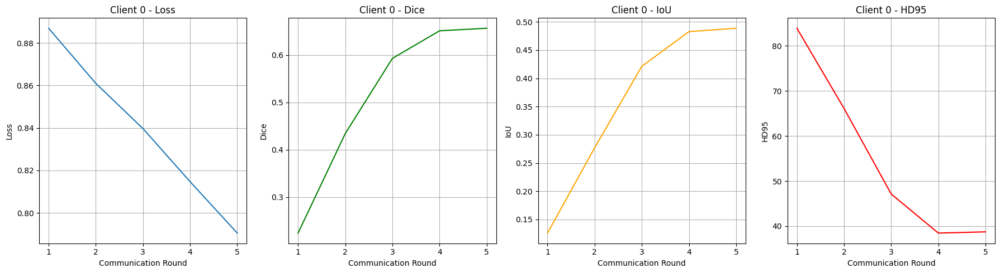

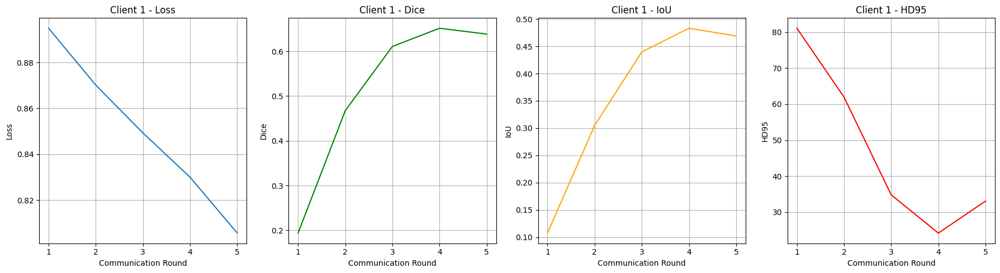

In [60]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

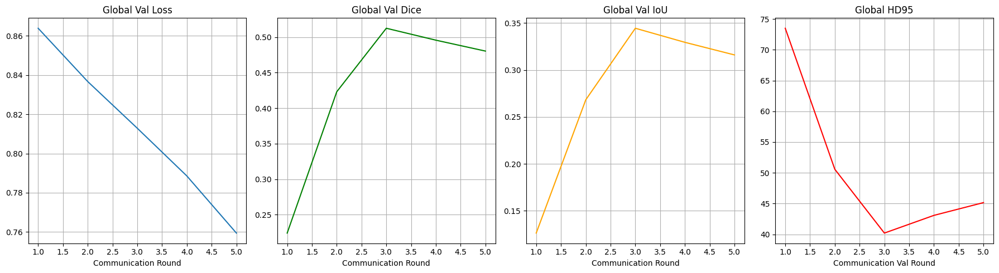

In [61]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [62]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_11600\837846673.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth

Test samples: 29
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing: 100%|██████████| 29/29 [00:09<00:00,  2.93it/s, Dice=0.5326, IoU=0.3629, HD95=46.5695]


Test Set Metrics:
Dice: 0.5326
IoU: 0.3629
HD95: 46.5695


**Visualize**

29


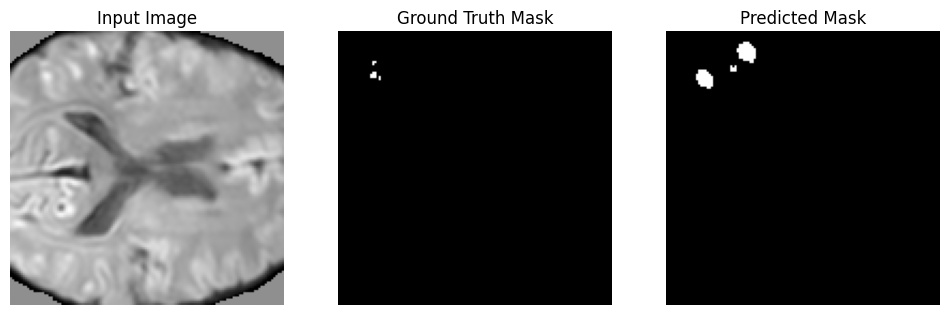

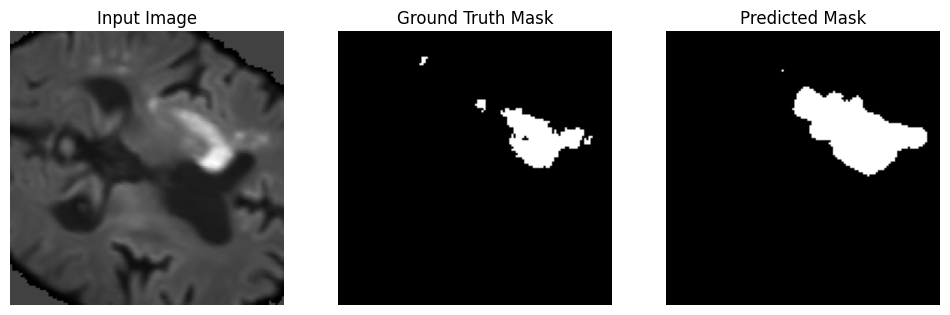

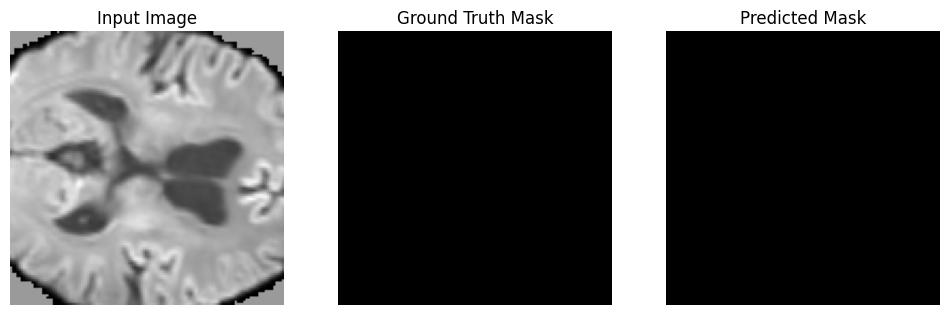

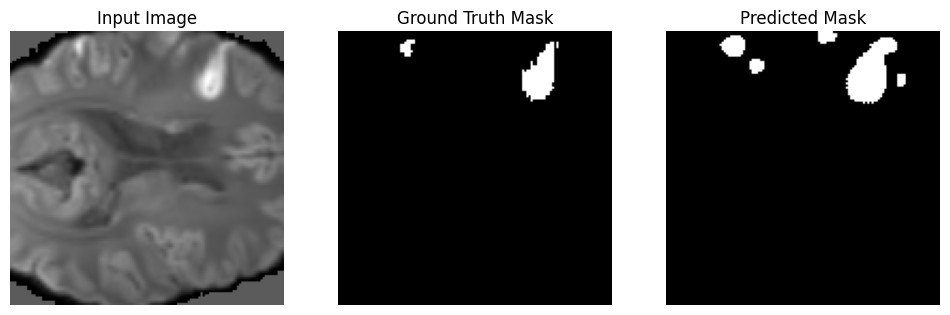

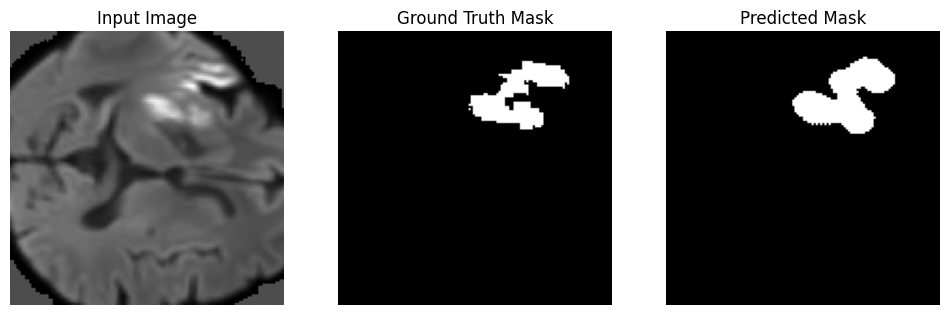

...

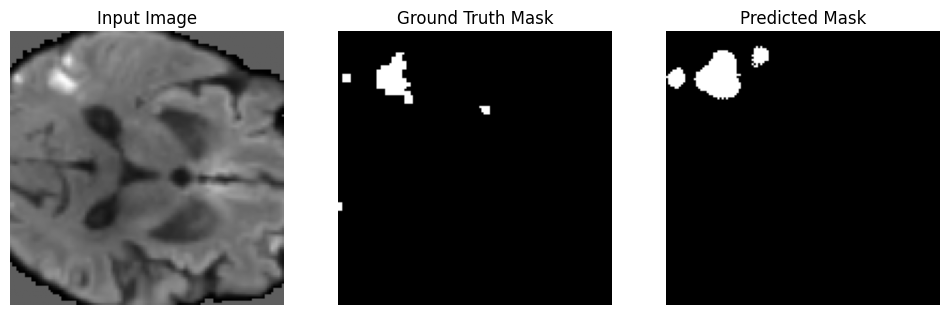

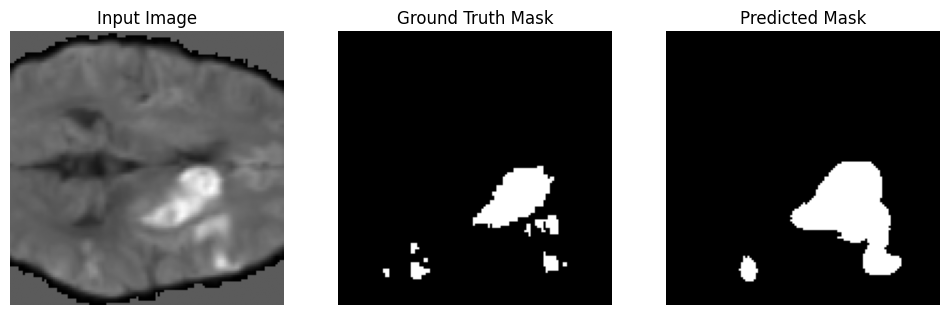

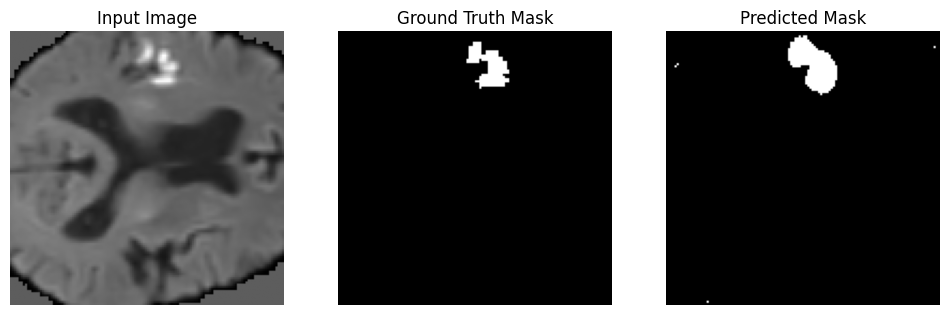

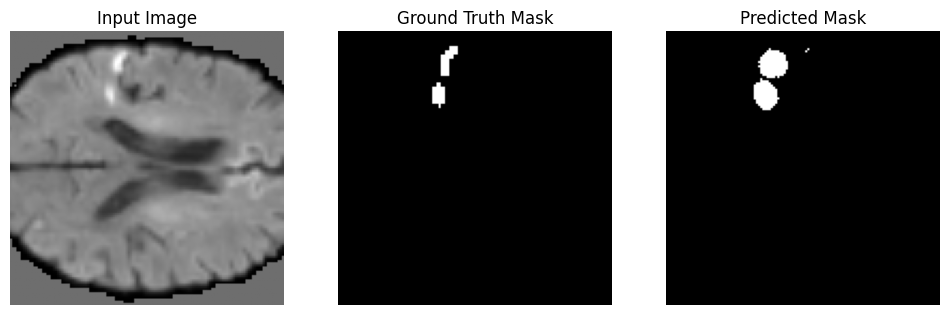

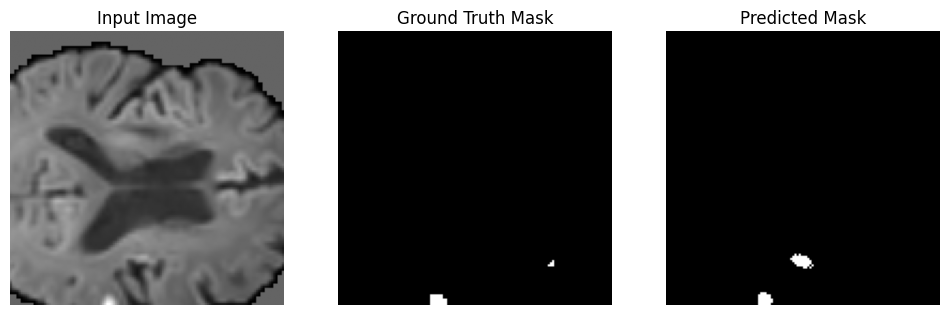

In [63]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()